# (sFigure2)-The Heterogeneity of Cell Types and Patients at Singlecell Resolution.

In [2]:
import omicverse as ov 
import scanpy as sc
import anndata as ad
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd 

2024-10-23 07:04:42.236577: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-23 07:04:42.251793: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-23 07:04:42.256247: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-23 07:04:43.151779: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.8, Tutorials: https://omicverse.readthedocs.io/


In [6]:
import os
from matplotlib import rcParams
from matplotlib.font_manager import FontProperties

font_path = 'Gastric/Arial.ttf'
front_prop = FontProperties(fname=font_path)
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white')

In [7]:
adata = sc.read_h5ad("Gastric/Data/Gastric_anno.h5ad")
adata

AnnData object with n_obs × n_vars = 63398 × 2000
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden', 'major_celltype', 'Person'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Group_number_colors', 'Person_colors', 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'dendrogram_Group_number', 'dendrogram_leiden', 'dendrogram_major_celltype', 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'major_celltype_colors', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [8]:
adata_raw = adata.raw.to_adata()
adata_raw.X.max()

9.053406

In [9]:
marker_genes_dict = {
    'Epithelial cell':['MUC5AC','MUC1','CDH1'],
    'B cell(Plasma cell)':['MZB1','DERL3','IGKC'],
    'B cell':['CD79A','MS4A1','BANK1'],
    'Endocrine cell':['CHGA','PCSK1N','SCG5'],
    'Myeloid cell':['AIF1','CD68','MS4A7'],
    'Mast cell':['TPSAB1','TPSB2','CPA3'],
    'Fibroblast':['DCN','DPT','PDGFRA'],
    'NK/T cell':['CD2','CD3E','CD7'],
    'Smooth muscle cell':['ACTA2','MYH11','ACTG2'],
    'Endothelial cell':['CLDN5','PECAM1','ACKR1'],
    'Neutrophil':['G0S2','CSF3R','FCGR3B'] 
}
all_genes = [gene for gene_list in marker_genes_dict.values() for gene in gene_list]

print(all_genes)


['MUC5AC', 'MUC1', 'CDH1', 'MZB1', 'DERL3', 'IGKC', 'CD79A', 'MS4A1', 'BANK1', 'CHGA', 'PCSK1N', 'SCG5', 'AIF1', 'CD68', 'MS4A7', 'TPSAB1', 'TPSB2', 'CPA3', 'DCN', 'DPT', 'PDGFRA', 'CD2', 'CD3E', 'CD7', 'ACTA2', 'MYH11', 'ACTG2', 'CLDN5', 'PECAM1', 'ACKR1', 'G0S2', 'CSF3R', 'FCGR3B']


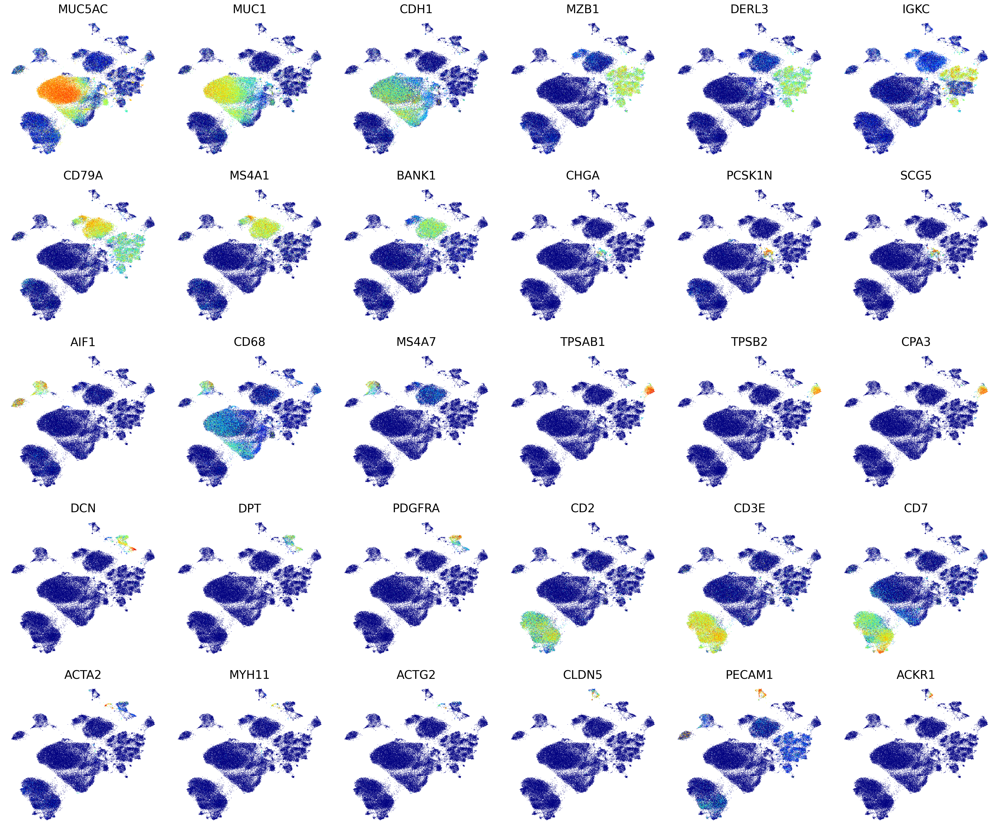

In [11]:
import matplotlib.pyplot as plt
import matplotlib as mpl
fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(24, 20), sharex=True, sharey=True)

for i, row_axes in enumerate(axes):
    for j, ax in enumerate(row_axes):
        axes = ov.utils.embedding(adata,
                               basis='X_umap',
                               color=all_genes[i * 6 + j],
                               title=all_genes[i * 6 + j],
                               frameon=False,
                               show=False,
                               legend_loc=False,
                               color_map = mpl.cm.get_cmap('jet'),
                               colorbar_loc=None,
                               legend_fontsize=18,
                               ax=ax)
        axes.set_title(all_genes[i * 6 + j],fontdict={'size':20})

plt.tight_layout()
plt.savefig('Gastric/Figure/sFigure2/sFigure2_A.png', dpi=300)
plt.show()


[]

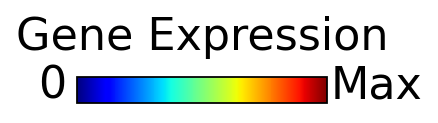

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

data = np.linspace(0, 1, 100).reshape(1, -1)
max_value = np.max(data)

min_value = 0
max_label = 2.5  

colormap = mpl.cm.get_cmap('jet')

fig, ax = plt.subplots(figsize=(2, 0.3)) 

norm = mpl.colors.Normalize(vmin=min_value, vmax=max_label)
cb = mpl.colorbar.ColorbarBase(ax, cmap=colormap, norm=norm, orientation='horizontal')

cb.ax.set_title('Gene Expression', fontsize=20, pad=12)  

cb.ax.text(-0.25, -0.15, '0', ha='center', va='bottom', fontsize=20)
cb.ax.text(3.0, -0.15, 'Max', ha='center', va='bottom', fontsize=20)

fig.subplots_adjust(top=0.7)

cb.ax.set_xticks([])

#plt.show()
plt.savefig('Gastric/Figure/sFigure2/sFigure2_A_legend.png', dpi=300, bbox_inches='tight')
#plt.savefig('colorbar_plot.png', bbox_inches='tight')

chi2: 16300.89860402397, dof: 20, pvalue: 0.0


Text(0.5, 1.0, 'Ro/e')

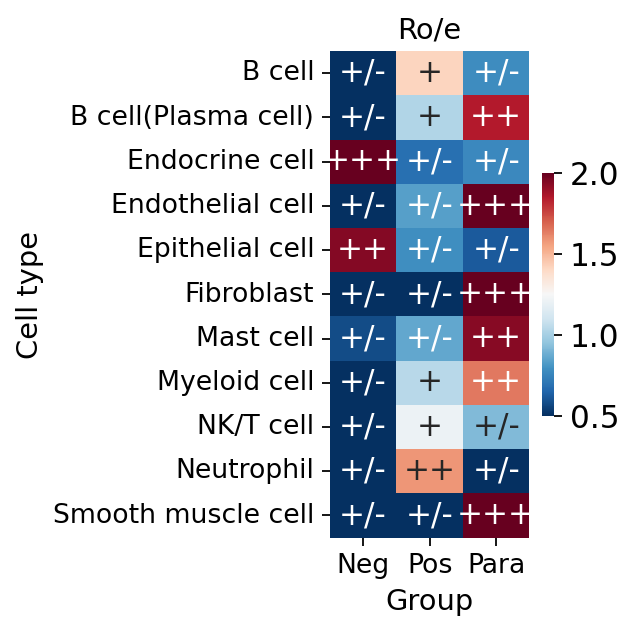

In [13]:
roe=ov.utils.roe(adata,sample_key='Sample',cell_type_key='major_celltype')
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(2,4))

transformed_roe = roe.copy()
transformed_roe = transformed_roe.applymap(
    lambda x: '+++' if x >= 2 else ('++' if x >= 1.5 else ('+' if x >= 1 else '+/-')))

sns.heatmap(roe, annot=transformed_roe, cmap='RdBu_r', fmt='', 
            cbar=True, ax=ax,vmin=0.5,vmax=2,cbar_kws={'shrink':0.5})
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.xlabel('Group',fontsize=13)
plt.ylabel('Cell type',fontsize=13)
plt.title('Ro/e',fontsize=13)
plt.savefig("Gastric/Figure/sFigure2/sFigure2_B.png",dpi=300,bbox_inches = 'tight')

    using 'X_pca' with n_pcs = 100
Storing dendrogram info using `.uns['dendrogram_Person']`


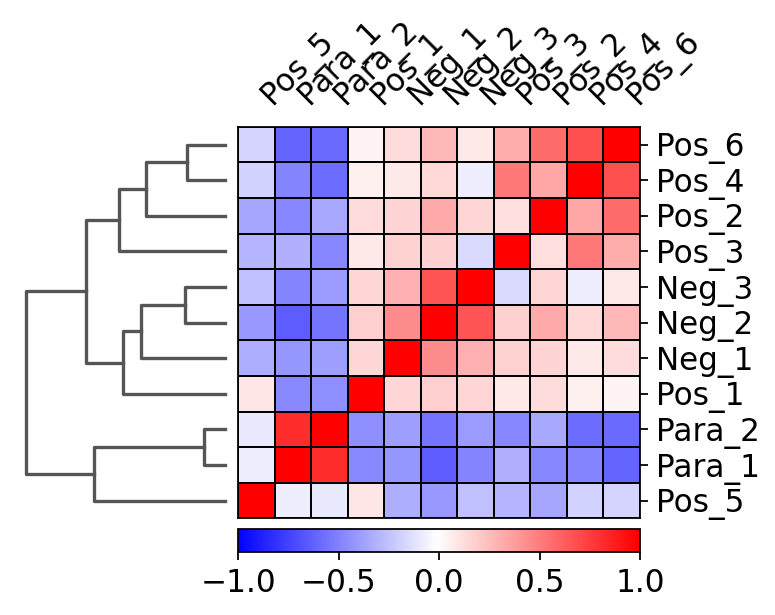

In [14]:
ax = sc.pl.correlation_matrix(adata, 'Person', figsize=(5,3.5),show=False)
plt.savefig("Gastric/Figure/sFigure2/sFigure2_C.png",dpi=300,bbox_inches = 'tight')